# SemesterAssignment

## Table of contents

* [Preprocessing](#chapter1)
    * [Libraries](#section_1_0)
    * [Scalers](#section_1_0_1)
    * [1.1 Outlook of data](#section_1_1)
    * [1.2 NaN-values](#section_1_2)
    * [1.3 Grouping](#section_1_3)
    * [1.4 Scatter plot of groups - so far](#section_1_4)
    * [1.5 Most common species](#section_1_5)
    * [1.6 Most common tools?](#section_1_) # add
    * [1.7 Classifying (species)](#section_1_7)
    * [2.1 Heatmap distribution](#section_1_) # add
    * [2.2 Bubblemap distribution](#section_1_) #add
* [Supervised learning](#chapter2)
    * [1.1 algo1](#section_2_) #add
    * [1.2 algo2](#section_2_) #add
    * [1.3 algo3](#section_2_) #add
* [Unsupervised learning](#chapter3)
    * [1.1 Preprocessing](#section_3_) #add
    * [1.2 Cluster1](#section_3_) #add 
   

## Libraries <a class="anchor" id="section_1_0"></a>

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

## Scalers <a class="anchor" id="section_1_0_1"></a>

In [3]:
standard_scaler = StandardScaler() # perhaps use for PCA? If needed...

## Preprocessing <a class="anchor" id="chapter1"></a>

### Outlook of data 1.1 <a id="section_1_1"></a>

In [4]:
data = pd.read_csv("elektronisk-rapportering-ers-2018-fangstmelding-dca-simple.csv", sep=";")
data.head()

,Melding ID,Meldingstidspunkt,Meldingsdato,Meldingsklokkeslett,Starttidspunkt,Startdato,Startklokkeslett,Startposisjon bredde,Startposisjon lengde,Hovedområde start (kode),...,Art - FDIR,Art - gruppe (kode),Art - gruppe,Rundvekt,Lengdegruppe (kode),Lengdegruppe,Bruttotonnasje 1969,Bruttotonnasje annen,Bredde,Fartøylengde
0,1497177,01.01.2018,01.01.2018,00:00,31.12.2017,31.12.2017,00:00,"-60,35","-46,133",NaN,...,Antarktisk krill,506.0,Antarktisk krill,706714.0,5.0,28 m og over,9432.0,NaN,"19,87","133,88"
1,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Hyse,202.0,Hyse,9594.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
2,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Torsk,201.0,Torsk,8510.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
3,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Blåkveite,301.0,Blåkveite,196.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
4,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Sei,203.0,Sei,134.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305434 entries, 0 to 305433
Data columns (total 45 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Melding ID                305434 non-null  int64  
 1   Meldingstidspunkt         305434 non-null  object 
 2   Meldingsdato              305434 non-null  object 
 3   Meldingsklokkeslett       305434 non-null  object 
 4   Starttidspunkt            305434 non-null  object 
 5   Startdato                 305434 non-null  object 
 6   Startklokkeslett          305434 non-null  object 
 7   Startposisjon bredde      305434 non-null  object 
 8   Startposisjon lengde      305434 non-null  object 
 9   Hovedområde start (kode)  303433 non-null  float64
 10  Hovedområde start         301310 non-null  object 
 11  Lokasjon start (kode)     303433 non-null  float64
 12  Havdybde start            305434 non-null  int64  
 13  Stopptidspunkt            305434 non-null  o

In [6]:
data.describe()

,Melding ID,Hovedområde start (kode),Lokasjon start (kode),Havdybde start,Varighet,Fangstår,Hovedområde stopp (kode),Lokasjon stopp (kode),Havdybde stopp,Trekkavstand,Redskap FDIR (kode),Hovedart - FDIR (kode),Art - FDIR (kode),Art - gruppe (kode),Rundvekt,Lengdegruppe (kode),Bruttotonnasje 1969,Bruttotonnasje annen
count,3.054340e+05,303433.000000,303433.000000,305434.000000,305434.000000,305434.000000,303472.000000,303472.000000,305434.000000,3.054100e+05,305246.000000,300456.000000,300452.000000,300452.000000,3.004560e+05,304750.000000,234005.000000,74774.000000
mean,1.658783e+06,14.463737,19.074712,-228.025292,537.095526,2017.999941,14.430415,18.883353,-229.084850,1.566397e+04,46.489746,1326.729934,1414.625914,259.746585,7.438208e+03,4.575032,1408.386975,186.172573
std,9.130738e+04,13.001244,18.469340,226.062493,2201.624688,0.007677,12.973150,18.361244,224.277365,9.033085e+04,13.534202,614.506560,633.188386,320.124913,4.281086e+04,0.692769,1148.384145,165.761157
min,1.497177e+06,0.000000,0.000000,-5388.000000,0.000000,2017.000000,0.000000,0.000000,-5388.000000,0.000000e+00,11.000000,412.000000,211.000000,101.000000,0.000000e+00,3.000000,104.000000,21.000000
25%,1.567228e+06,5.000000,7.000000,-273.000000,123.000000,2018.000000,5.000000,7.000000,-274.000000,2.533000e+03,32.000000,1022.000000,1022.000000,201.000000,6.400000e+01,4.000000,496.000000,87.000000
50%,1.674230e+06,8.000000,12.000000,-196.000000,296.000000,2018.000000,8.000000,12.000000,-198.000000,7.598000e+03,51.000000,1032.000000,1032.000000,203.000000,3.000000e+02,5.000000,1184.000000,149.000000
75%,1.735590e+06,20.000000,24.000000,-128.000000,494.000000,2018.000000,20.000000,24.000000,-127.000000,2.259900e+04,55.000000,1038.000000,2202.000000,302.000000,2.236000e+03,5.000000,2053.000000,236.000000
max,1.800291e+06,81.000000,87.000000,1220.000000,125534.000000,2018.000000,81.000000,87.000000,1616.000000,1.588863e+07,80.000000,6619.000000,6619.000000,9903.000000,1.100000e+06,5.000000,9432.000000,1147.000000


In [7]:
data.iloc[100]

Melding ID                           1497342
Meldingstidspunkt           01.01.2018 23:30
Meldingsdato                      01.01.2018
Meldingsklokkeslett                    23:30
Starttidspunkt              01.01.2018 07:58
Startdato                         01.01.2018
Startklokkeslett                       07:58
Startposisjon bredde                  71,262
Startposisjon lengde                  25,188
Hovedområde start (kode)                 4.0
Hovedområde start              Vest-Finnmark
Lokasjon start (kode)                   26.0
Havdybde start                          -289
Stopptidspunkt              01.01.2018 14:04
Stoppdato                         01.01.2018
Stoppklokkeslett                       14:04
Varighet                                 366
Fangstår                                2018
Stopposisjon bredde                   71,317
Stopposisjon lengde                   25,225
Hovedområde stopp (kode)                 4.0
Hovedområde stopp              Vest-Finnmark
Lokasjon s

In [8]:
#Converting so that every "," goes to "."
coloumns_to_convert = ["Startposisjon bredde", "Startposisjon lengde", "Stopposisjon bredde", "Stopposisjon lengde", "Bredde", "Fartøylengde"]
data[coloumns_to_convert] = data[coloumns_to_convert].replace({',': '.'}, regex=True)

In [9]:
data.iloc[100]

Melding ID                           1497342
Meldingstidspunkt           01.01.2018 23:30
Meldingsdato                      01.01.2018
Meldingsklokkeslett                    23:30
Starttidspunkt              01.01.2018 07:58
Startdato                         01.01.2018
Startklokkeslett                       07:58
Startposisjon bredde                  71.262
Startposisjon lengde                  25.188
Hovedområde start (kode)                 4.0
Hovedområde start              Vest-Finnmark
Lokasjon start (kode)                   26.0
Havdybde start                          -289
Stopptidspunkt              01.01.2018 14:04
Stoppdato                         01.01.2018
Stoppklokkeslett                       14:04
Varighet                                 366
Fangstår                                2018
Stopposisjon bredde                   71.317
Stopposisjon lengde                   25.225
Hovedområde stopp (kode)                 4.0
Hovedområde stopp              Vest-Finnmark
Lokasjon s

In [10]:
# And we want to convert to floats
data[coloumns_to_convert] = data[coloumns_to_convert].astype(float)

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305434 entries, 0 to 305433
Data columns (total 45 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Melding ID                305434 non-null  int64  
 1   Meldingstidspunkt         305434 non-null  object 
 2   Meldingsdato              305434 non-null  object 
 3   Meldingsklokkeslett       305434 non-null  object 
 4   Starttidspunkt            305434 non-null  object 
 5   Startdato                 305434 non-null  object 
 6   Startklokkeslett          305434 non-null  object 
 7   Startposisjon bredde      305434 non-null  float64
 8   Startposisjon lengde      305434 non-null  float64
 9   Hovedområde start (kode)  303433 non-null  float64
 10  Hovedområde start         301310 non-null  object 
 11  Lokasjon start (kode)     303433 non-null  float64
 12  Havdybde start            305434 non-null  int64  
 13  Stopptidspunkt            305434 non-null  o

We see now that out "Startposisjon bredde" and more, are now floats and not objects anymore, this will be easier to work with later

### NaN-values 1.2 <a id="section_1_2"></a>

We want to replace some values that are not of significant for us, this by some createria:

In [12]:
data.isnull().sum()

Melding ID                       0
Meldingstidspunkt                0
Meldingsdato                     0
Meldingsklokkeslett              0
Starttidspunkt                   0
Startdato                        0
Startklokkeslett                 0
Startposisjon bredde             0
Startposisjon lengde             0
Hovedområde start (kode)      2001
Hovedområde start             4124
Lokasjon start (kode)         2001
Havdybde start                   0
Stopptidspunkt                   0
Stoppdato                        0
Stoppklokkeslett                 0
Varighet                         0
Fangstår                         0
Stopposisjon bredde              0
Stopposisjon lengde              0
Hovedområde stopp (kode)      1962
Hovedområde stopp             4124
Lokasjon stopp (kode)         1962
Havdybde stopp                   0
Trekkavstand                    24
Redskap FAO (kode)               0
Redskap FAO                    188
Redskap FDIR (kode)            188
Redskap FDIR        

In [13]:
columns_to_check = ['Rundvekt', 'Art FAO', 'Bredde', 'Art - FDIR']

# if any of these values have NaN-values we want to remove them, since we need them for our prediciton later
data.dropna(subset=columns_to_check, how='any', inplace=True)

In [14]:
data.isnull().sum()

Melding ID                       0
Meldingstidspunkt                0
Meldingsdato                     0
Meldingsklokkeslett              0
Starttidspunkt                   0
Startdato                        0
Startklokkeslett                 0
Startposisjon bredde             0
Startposisjon lengde             0
Hovedområde start (kode)      1786
Hovedområde start             3760
Lokasjon start (kode)         1786
Havdybde start                   0
Stopptidspunkt                   0
Stoppdato                        0
Stoppklokkeslett                 0
Varighet                         0
Fangstår                         0
Stopposisjon bredde              0
Stopposisjon lengde              0
Hovedområde stopp (kode)      1760
Hovedområde stopp             3760
Lokasjon stopp (kode)         1760
Havdybde stopp                   0
Trekkavstand                    19
Redskap FAO (kode)               0
Redskap FAO                    187
Redskap FDIR (kode)            187
Redskap FDIR        

Now that all the Art (species) values have no null values, we can look at the smaller specifics:

In [15]:
columns_to_check_location = ['Hovedområde start', 'Hovedområde stopp', 'Redskap FAO', 'Redskap FDIR']
data.dropna(subset=columns_to_check_location, how='any', inplace=True)
# Again dropping rows that have NaN values, since we need some of these features for our prediction later.

In [16]:
data.isnull().sum()

Melding ID                       0
Meldingstidspunkt                0
Meldingsdato                     0
Meldingsklokkeslett              0
Starttidspunkt                   0
Startdato                        0
Startklokkeslett                 0
Startposisjon bredde             0
Startposisjon lengde             0
Hovedområde start (kode)         0
Hovedområde start                0
Lokasjon start (kode)            0
Havdybde start                   0
Stopptidspunkt                   0
Stoppdato                        0
Stoppklokkeslett                 0
Varighet                         0
Fangstår                         0
Stopposisjon bredde              0
Stopposisjon lengde              0
Hovedområde stopp (kode)       183
Hovedområde stopp                0
Lokasjon stopp (kode)          183
Havdybde stopp                   0
Trekkavstand                    19
Redskap FAO (kode)               0
Redskap FAO                      0
Redskap FDIR (kode)              0
Redskap FDIR        

We know that we will remove the columns that have "(kode)" in them, since they dont help us with any significance, but we will do this later.

We will also drop the "Bruttotonnasje 1969" and "annen" since, they have so many missing values, and since we also dont need them for later, we will just remove them.

What do we then need?
    *Hovedart / art -> fishes 
    *Punkter (start / slutt) -> coordinates
    *Bredde / Fartøylengde -> size of vessel (width and length)
    *Rundvekt -> Weight with fish, should be scaled to show the most fishes caught instead of specifics!

### Grouping 1.3 <a id="section_1_3"></a>

We are just going to group them after their Message ID, since one trip can have (and in most cases has) multiple and the same Message ID, we can group them so that each trip will (hopefully) only be one row

In [17]:
grouped_data = data.groupby('Melding ID')

In [18]:
type(grouped_data)

pandas.core.groupby.generic.DataFrameGroupBy

In [19]:
grouped_data.groups

{1497178: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], 1497229: [19, 20, 21], 1497249: [22, 23, 24, 25], 1497288: [26, 27, 28, 29, 30, 31], 1497306: [32, 33, 34, 35, 36], 1497310: [37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52], 1497311: [53, 54, 55], 1497312: [56], 1497314: [57, 58, 59, 60], 1497321: [61, 62], 1497323: [63, 64, 65, 67, 68, 69, 70, 71], 1497326: [72, 73, 74, 75, 76, 77], 1497330: [78, 79, 80, 81, 82, 83, 84], 1497332: [85, 86, 87, 88, 89], 1497341: [90, 91, 92, 93], 1497342: [94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106], 1497344: [107, 108], 1497350: [111, 112], 1497351: [113, 114], 1497352: [115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126], 1497353: [127, 128, 129], 1497354: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140], 1497358: [141, 142], 1497362: [144, 145, 146, 147], 1497364: [148, 149, 150, 151, 152, 153], 1497368: [154, 155, 156, 157, 158, 159, 160], 1497377: [162, 163], 1497383: [164, 165,

In [20]:
specific_group = grouped_data.get_group(1497178)
group_key = 1497178

In [21]:
specific_group

,Melding ID,Meldingstidspunkt,Meldingsdato,Meldingsklokkeslett,Starttidspunkt,Startdato,Startklokkeslett,Startposisjon bredde,Startposisjon lengde,Hovedområde start (kode),...,Art - FDIR,Art - gruppe (kode),Art - gruppe,Rundvekt,Lengdegruppe (kode),Lengdegruppe,Bruttotonnasje 1969,Bruttotonnasje annen,Bredde,Fartøylengde
1,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,74.885,16.048,20.0,...,Hyse,202.0,Hyse,9594.0,5.0,28 m og over,1476.0,NaN,12.6,56.8
2,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,74.885,16.048,20.0,...,Torsk,201.0,Torsk,8510.0,5.0,28 m og over,1476.0,NaN,12.6,56.8
3,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,74.885,16.048,20.0,...,Blåkveite,301.0,Blåkveite,196.0,5.0,28 m og over,1476.0,NaN,12.6,56.8
4,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,74.885,16.048,20.0,...,Sei,203.0,Sei,134.0,5.0,28 m og over,1476.0,NaN,12.6,56.8
5,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,74.910,15.868,20.0,...,Hyse,202.0,Hyse,9118.0,5.0,28 m og over,1476.0,NaN,12.6,56.8
6,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,74.910,15.868,20.0,...,Torsk,201.0,Torsk,6651.0,5.0,28 m og over,1476.0,NaN,12.6,56.8
7,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,74.910,15.868,20.0,...,Blåkveite,301.0,Blåkveite,130.0,5.0,28 m og over,1476.0,NaN,12.6,56.8
8,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,74.910,15.868,20.0,...,Flekksteinbit,304.0,Steinbiter,82.0,5.0,28 m og over,1476.0,NaN,12.6,56.8
9,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,74.910,15.868,20.0,...,Sei,203.0,Sei,67.0,5.0,28 m og over,1476.0,NaN,12.6,56.8
10,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,74.910,15.868,20.0,...,Kveite,320.0,"Annen flatfisk, bunnfisk og dypvannsfisk",14.0,5.0,28 m og over,1476.0,NaN,12.6,56.8


From here, we see that each catch, has the same time, showing off the different species, and that when they have another catch they again have a different time, we want to save these, but as less rows, we will come back to this later.

In [22]:
unique_startdates_counts = []

for name, group in grouped_data:
    unique_dates_count = len(group['Startdato'].unique())
        
    if unique_dates_count < 2:
        # ignore
        break
    elif unique_dates_count >= 2:
        unique_startdates_counts.append((name, unique_dates_count))

unique_startdates_counts

[(1497178, 2)]

We are making sure that there isnt a real big difference in the days inside each group, only one group has 2 different days(which we know are a day where its late, and it goes over to the next day, so this wont make a big difference), now we can group them togehter looking after their time, if the time is different inside the group we can make a new row, meaning that if they have the same time all the species have been caught at the same time, if not, then they have been caught at different times:

In [23]:
result_rows = []

for name, group in grouped_data:
    common_info = {
        'Melding ID': name,
        'latitude': group['Startposisjon bredde'].iloc[0],
        'longitude': group['Startposisjon lengde'].iloc[0],
        'main_location': group['Hovedområde start'].iloc[0],
        'main_species': group['Hovedart FAO'].iloc[0],
        'vessel_ratio(height/width)': group['Fartøylengde'].iloc[0] / group['Bredde'].iloc[0],
        'start_date': group['Startdato'].iloc[0]
    }

    unique_times = group['Startklokkeslett'].unique()

    for time in unique_times:
        time_filter = (group['Startklokkeslett'] == time)

        # Create a dictionary for species and weights observed at this time
        species_weights = dict(zip(group[time_filter]['Art - FDIR'], group[time_filter]['Rundvekt']))
        total_weight = sum(species_weights.values())

        # Create a result row with the common information, time, and species and weights at this time
        result_row = {**common_info, 'start_time': time, 'species_weights': species_weights, 'total_weight': total_weight}
        result_rows.append(result_row)

# Convert the list of dictionaries to a new DataFrame
result_df = pd.DataFrame(result_rows)

In [24]:
result_df

,Melding ID,latitude,longitude,main_location,main_species,vessel_ratio(height/width),start_date,start_time,species_weights,total_weight
0,1497178,74.885,16.048,Bjørnøya,Hyse,4.507937,30.12.2017,23:21,"{'Hyse': 9594.0, 'Torsk': 8510.0, 'Blåkveite':...",18434.0
1,1497178,74.885,16.048,Bjørnøya,Hyse,4.507937,30.12.2017,05:48,"{'Hyse': 9118.0, 'Torsk': 6651.0, 'Blåkveite':...",16062.0
2,1497178,74.885,16.048,Bjørnøya,Hyse,4.507937,30.12.2017,11:34,"{'Hyse': 12432.0, 'Torsk': 5097.0, 'Blåkveite'...",17878.0
3,1497178,74.885,16.048,Bjørnøya,Hyse,4.507937,30.12.2017,17:44,"{'Torsk': 7022.0, 'Hyse': 6758.0}",13780.0
4,1497229,67.828,12.972,Røstbanken til Malangsgrunnen,Hyse,3.774704,01.01.2018,10:01,{'Hyse': 4.0},4.0
...,...,...,...,...,...,...,...,...,...,...
91717,1800286,70.888,22.321,Vest-Finnmark,Sei,3.789524,31.12.2018,15:07,"{'Sei': 5706.0, 'Torsk': 2998.0, 'Hyse': 258.0...",9023.0
91718,1800291,76.509,14.295,Vest-Spitsbergen,Hyse,4.547619,30.12.2018,23:20,"{'Hyse': 7277.0, 'Torsk': 3126.0, 'Blåkveite':...",11105.0
91719,1800291,76.509,14.295,Vest-Spitsbergen,Hyse,4.547619,30.12.2018,05:40,"{'Hyse': 6182.0, 'Torsk': 3452.0, 'Gråsteinbit...",10017.0
91720,1800291,76.509,14.295,Vest-Spitsbergen,Hyse,4.547619,30.12.2018,12:53,"{'Torsk': 5902.0, 'Hyse': 4315.0, 'Uer (vanlig...",10427.0


In [25]:
type(result_df)

pandas.core.frame.DataFrame

In [26]:
result_df["species_weights"]

0        {'Hyse': 9594.0, 'Torsk': 8510.0, 'Blåkveite':...
1        {'Hyse': 9118.0, 'Torsk': 6651.0, 'Blåkveite':...
2        {'Hyse': 12432.0, 'Torsk': 5097.0, 'Blåkveite'...
3                        {'Torsk': 7022.0, 'Hyse': 6758.0}
4                                            {'Hyse': 4.0}
                               ...                        
91717    {'Sei': 5706.0, 'Torsk': 2998.0, 'Hyse': 258.0...
91718    {'Hyse': 7277.0, 'Torsk': 3126.0, 'Blåkveite':...
91719    {'Hyse': 6182.0, 'Torsk': 3452.0, 'Gråsteinbit...
91720    {'Torsk': 5902.0, 'Hyse': 4315.0, 'Uer (vanlig...
91721    {'Hyse': 9370.0, 'Torsk': 4245.0, 'Gråsteinbit...
Name: species_weights, Length: 91722, dtype: object

In [27]:
group_data = result_df.groupby('Melding ID')

In [28]:
group_data.groups

{1497178: [0, 1, 2, 3], 1497229: [4, 5], 1497249: [6, 7, 8], 1497288: [9], 1497306: [10], 1497310: [11, 12, 13, 14], 1497311: [15], 1497312: [16], 1497314: [17], 1497321: [18], 1497323: [19, 20, 21], 1497326: [22], 1497330: [23, 24, 25, 26, 27], 1497332: [28], 1497341: [29, 30, 31, 32], 1497342: [33, 34, 35], 1497344: [36], 1497350: [37], 1497351: [38], 1497352: [39, 40, 41], 1497353: [42], 1497354: [43, 44, 45], 1497358: [46, 47], 1497362: [48], 1497364: [49, 50], 1497368: [51], 1497377: [52], 1497383: [53, 54, 55], 1497384: [56, 57, 58, 59], 1497414: [60, 61], 1497421: [62, 63, 64, 65, 66, 67], 1497422: [68, 69], 1497423: [70, 71, 72], 1497424: [73, 74, 75], 1497426: [76, 77, 78, 79], 1497432: [80, 81], 1497433: [82], 1497435: [83, 84, 85, 86], 1497444: [87], 1497448: [88, 89, 90], 1497475: [91, 92], 1497482: [93], 1497484: [94], 1497489: [95], 1497495: [96], 1497505: [97], 1497514: [98], 1497531: [99], 1497537: [100], 1497550: [101], 1497555: [102], 1497556: [103, 104], 1497559: [10

In [29]:
group_data.head()

,Melding ID,latitude,longitude,main_location,main_species,vessel_ratio(height/width),start_date,start_time,species_weights,total_weight
0,1497178,74.885,16.048,Bjørnøya,Hyse,4.507937,30.12.2017,23:21,"{'Hyse': 9594.0, 'Torsk': 8510.0, 'Blåkveite':...",18434.0
1,1497178,74.885,16.048,Bjørnøya,Hyse,4.507937,30.12.2017,05:48,"{'Hyse': 9118.0, 'Torsk': 6651.0, 'Blåkveite':...",16062.0
2,1497178,74.885,16.048,Bjørnøya,Hyse,4.507937,30.12.2017,11:34,"{'Hyse': 12432.0, 'Torsk': 5097.0, 'Blåkveite'...",17878.0
3,1497178,74.885,16.048,Bjørnøya,Hyse,4.507937,30.12.2017,17:44,"{'Torsk': 7022.0, 'Hyse': 6758.0}",13780.0
4,1497229,67.828,12.972,Røstbanken til Malangsgrunnen,Hyse,3.774704,01.01.2018,10:01,{'Hyse': 4.0},4.0
...,...,...,...,...,...,...,...,...,...,...
91717,1800286,70.888,22.321,Vest-Finnmark,Sei,3.789524,31.12.2018,15:07,"{'Sei': 5706.0, 'Torsk': 2998.0, 'Hyse': 258.0...",9023.0
91718,1800291,76.509,14.295,Vest-Spitsbergen,Hyse,4.547619,30.12.2018,23:20,"{'Hyse': 7277.0, 'Torsk': 3126.0, 'Blåkveite':...",11105.0
91719,1800291,76.509,14.295,Vest-Spitsbergen,Hyse,4.547619,30.12.2018,05:40,"{'Hyse': 6182.0, 'Torsk': 3452.0, 'Gråsteinbit...",10017.0
91720,1800291,76.509,14.295,Vest-Spitsbergen,Hyse,4.547619,30.12.2018,12:53,"{'Torsk': 5902.0, 'Hyse': 4315.0, 'Uer (vanlig...",10427.0


Much better, now actually showing each group with the same "Melding ID" as one group, containing multiple catches and their corresponding species and weights, and so on...

## 1.4 Scatter plot of groups - so far <a id="section_1_4"></a>

It would be beneficial to show some of the information, like the vessel Ratio comparied to the total weight for each group, to be represented.

In [30]:
total_catch_by_group = group_data["total_weight"].sum()
vessel_size_by_group = group_data["vessel_ratio(height/width)"].first()

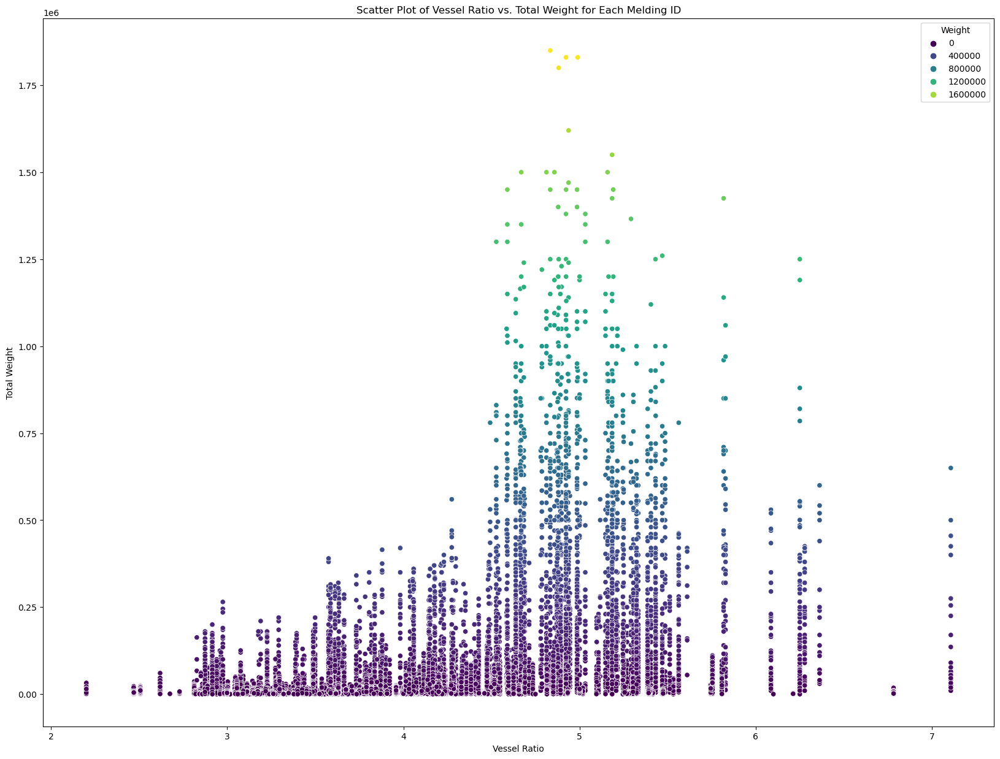

In [31]:
scatter_data = pd.DataFrame({ # only for representation, for now.
    'Melding ID': total_catch_by_group.index,
    'Total Weight': total_catch_by_group.values,
    'Vessel Ratio': vessel_size_by_group.values
})

plt.figure(figsize=(20, 15))
sns.scatterplot(x='Vessel Ratio', y='Total Weight', hue='Total Weight', data=scatter_data, palette='viridis')
plt.title('Scatter Plot of Vessel Ratio vs. Total Weight for Each Melding ID')
plt.xlabel('Vessel Ratio')
plt.ylabel('Total Weight')
plt.legend(title='Weight')
plt.show()

This isnt really giving us the best representation out there, but it is a good start! Since most of these groups will be a lot smaller than some of the really bigger ones, its hard to represent them all in one plot together, so this will be our starting point.

## Most common species 1.5 <a id="section_1_5"></a>

We want to only predict some species, the most common ones, but the most common here, we define as the ones that have been seen the most in the groups themselves, so counted up the most, not necessary the most caught in terms of weight

In [105]:
most_common_range = 10

In [104]:
key_counts = {}

for name, group in group_data:
    dictionaries = group.to_dict(orient='records')

    for dictionary in dictionaries:
        species_weights = dictionary.get("species_weights")
        if species_weights:
            for key in species_weights.keys():
                key_counts[key] = key_counts.get(key, 0) + 1  
                # we increment them for each key...

sorted_key_counts = dict(sorted(key_counts.items(), key=lambda item: item[1], reverse=True))

# Create a DataFrame with the most common tools and their counts
most_common_fish = pd.DataFrame(list(sorted_key_counts.items()), columns=['Fishes', 'Count'])
most_common_fish

,Fishes,Count
0,Torsk,56066
1,Sei,42295
2,Hyse,38788
3,Lange,17259
4,Uer (vanlig),14120
...,...,...
113,Trollkrabbe,1
114,Blæretang,1
115,Ansjos,1
116,Rød kråkebolle,1


In [106]:
most_common_species = most_common_fish[:most_common_range]
other_most_common_species = most_common_fish[most_common_range:]

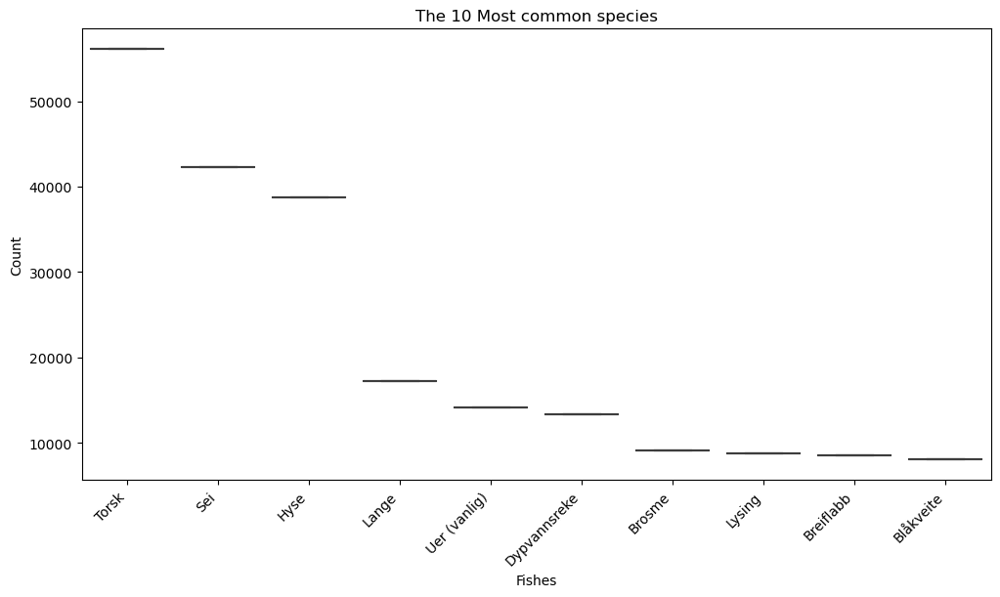

In [109]:
# Create a boxplot using Seaborn
plt.figure(figsize=(12, 6))
sns.boxplot(x='Fishes', y='Count', data=most_common_species)
plt.xlabel('Fishes')
plt.ylabel('Count')
plt.title(f'The {most_common_range} Most common species')
plt.xticks(rotation=45, ha='right')  # Adjust rotation for better readability
plt.show()

We see the most common species out there, the ones that have been "counted" up the most, meaning have dealt with them the most!

In [111]:
# maybe needed for tools as well? ???

In [ ]:
from collections import Counter
# Assuming you have a DataFrameGroupBy object named grouped_data
# Example: grouped_data = df.groupby(['ExistingGroupColumn'])

# Define a function to count occurrences of each tool across all groups
def count_tools_across_groups(subgroup):
    # Use Counter to count occurrences of each tool within the subgroup
    tool_counter = Counter(subgroup['Art - '])
    
    return tool_counter

# Apply the counting function across all groups
tools_counter = grouped_data.apply(count_tools_across_groups)

# Combine counters from all groups
combined_counter = Counter()
for counter in tools_counter:
    combined_counter.update(counter)

# Create a DataFrame with the most common tools and their counts
most_common_tools_df = pd.DataFrame(list(combined_counter.items()), columns=['Tool', 'Count'])

# Sort the DataFrame by count in descending order
most_common_tools_df = most_common_tools_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

## Classifying (species) 1.7 <a id="section_1_7"></a>

In [ ]:
grouped_data_df['Species_Classification'] = np.where(
    grouped_data_df['Hovedart FAO'].isin(grouped_species_most_common["Art - FDIR"]),
    grouped_data_df['Hovedart FAO'],
    'Other'
)
# replacing the values, so that "Hovedart FAO" and "Art - FDIR" are the same in all cases
grouped_data_df['Art - FDIR'] = grouped_data_df['Art - FDIR'].replace({
    'Reke av  Palaemonidaeslekten': 'Reke av  Palaemonidaefamilien',
    'Hakes nei *': 'Hakes nei. *',
    'Annen vanlig ti-armet blekksprut': 'Various squids nei *',
    'Pink cusk-eel *' : 'Pink cusk-eel*'
})
main_fish_rows = grouped_data_df[grouped_data_df['Hovedart FAO'] == grouped_data_df['Art - FDIR']]

grouped_data_df['Main Fish Weight'] = main_fish_rows['Rundvekt']


mismatched_rows = grouped_data_df[grouped_data_df['Hovedart FAO'] != grouped_data_df['Art - FDIR']]
for index in mismatched_rows.index:
   
    group_size = grouped_data_df.loc[grouped_data_df.index == index].shape
    print(f"Group at index {index} has size: {group_size}")

    
    art_fdir_value = grouped_data_df.at[index, 'Art - FDIR']
    print(f"Art FDIR value for this row: {art_fdir_value}")
    
    print(art_fdir_value == grouped_data_df.at[index, 'Hovedart FAO'])
    print(art_fdir_value)
    print(grouped_data_df.at[index, 'Hovedart FAO'])
    
    print("\n") 

In [20]:
total_catch_by_group = grouped_data["Rundvekt"].sum()
vessel_length_by_group = grouped_data["Fartøylengde"].mean() # bruk heller det første verdiet (men sjekk heller at denne er lik!)
vessel_width_by_group = grouped_data["Bredde"].mean() # Fartøybredde
vessel_size_by_group = vessel_length_by_group * vessel_width_by_group

In [21]:
# Here we need to scale the weights, and such so that we more easily can work with it later
# this we can do by using he RobustScaler, we defined before :)

In [22]:
# Reshape the arrays to 2D arrays before scaling
rundvekt_values = total_catch_by_group.values.reshape(-1, 1)
vessel_size_values = vessel_size_by_group.values.reshape(-1, 1)
scaler = RobustScaler()

scaled_rundvekt = scaler.fit_transform(rundvekt_values)
scaled_vessel_size = scaler.fit_transform(vessel_size_values)


# Create a new DataFrame with Melding ID, scaled Rundvekt, and scaled Fartøylengde
scaled_data = pd.DataFrame({
    'Melding ID': total_catch_by_group.index,
    'Scaled Rundvekt': scaled_rundvekt.flatten(),
    'Scaled Size': scaled_vessel_size.flatten(),
    'Non_scaled_Rundvekt': total_catch_by_group.values
})

# Now, scaled_data contains the Melding ID, scaled Rundvekt, and scaled Fartøylengde
scaled_data

,Melding ID,Scaled Rundvekt,Scaled Size,Non_scaled_Rundvekt
0,1497178,2.116012,0.703588,66154.0
1,1497229,-0.318579,-0.454308,1854.0
2,1497249,-0.355799,0.411343,871.0
3,1497288,-0.187952,-0.172306,5304.0
4,1497306,0.039870,0.236190,11321.0
...,...,...,...,...
46356,1800268,1.007573,0.836617,36879.0
46357,1800269,0.571542,0.245776,25363.0
46358,1800285,0.718602,1.372474,29247.0
46359,1800286,0.378403,0.146397,20262.0


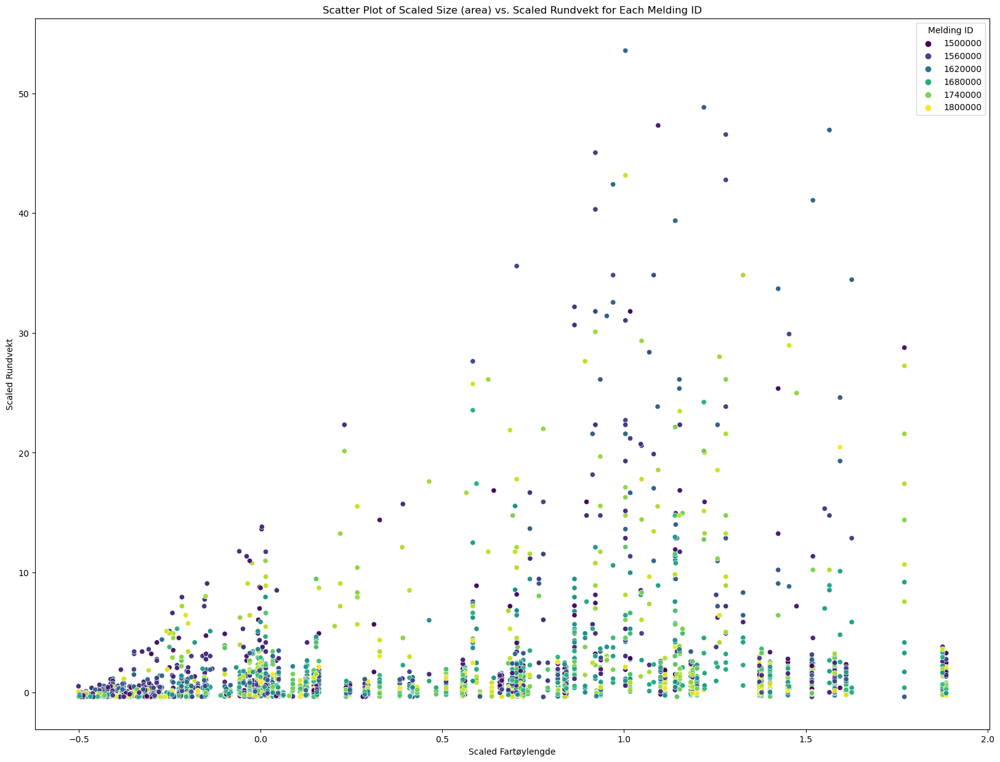

In [23]:
# Create a scatter plot using scaled_data
plt.figure(figsize=(20, 15))
sns.scatterplot(x='Scaled Size', y='Scaled Rundvekt', hue='Melding ID', data=scaled_data.sample(frac=0.1), palette='viridis')
plt.title('Scatter Plot of Scaled Size (area) vs. Scaled Rundvekt for Each Melding ID')
plt.xlabel('Scaled Fartøylengde')
plt.ylabel('Scaled Rundvekt')
plt.legend(title='Melding ID')
plt.show()

In [24]:
#We should also take in count that this is the area of the vessel, not its complete "size",
#but this is just for small represenation, there are also alot of other things that arent accurate by it,
#The purpose is just to get an idea how the data is spread, and work with it from there
#Since we also saw that the Bruttonottasje (the volume) for a lot of ships were missing 
# we instead used the width and length (area) to make the correlation between area and fish caugth among the groups.

In [25]:
# Define a function to calculate total weight for each species within each group
def calculate_total_weight(subgroup):
    return subgroup.groupby('Art - FDIR')['Rundvekt'].sum().reset_index()

# Apply the calculation function within each group
grouped_species_totals = grouped_data.apply(calculate_total_weight)

# Reset the index to obtain a DataFrame
grouped_species_totals_reset = grouped_species_totals.reset_index(drop=True)

# Calculate the most common species across all groups
most_common_species = grouped_species_totals_reset.groupby('Art - FDIR')['Rundvekt'].sum().sort_values(ascending=False).reset_index()
# Extract 'Rundvekt' column for scaling
rundvekt_column = most_common_species[['Rundvekt']]

# Reshape the array to 2D before scaling
rundvekt_values = rundvekt_column.values.reshape(-1, 1)

# Initialize the RobustScaler
scaler = RobustScaler()

# Fit and transform the data for rundvekt
scaled_rundvekt = scaler.fit_transform(rundvekt_values)

# Replace the 'Rundvekt' column with the scaled values in the DataFrame
most_common_species['Rundvekt'] = scaled_rundvekt.flatten()
most_common_species

,Art - FDIR,Rundvekt
0,Sild,553.501891
1,Kolmule,512.190447
2,Torsk,291.857609
3,Lodde,244.965436
4,Makrell,226.948124
...,...,...
113,Trollkrabbe,-0.021735
114,Isskate,-0.021745
115,Sanktpetersfisk,-0.021745
116,Vanlig fløyfisk,-0.021751


In [26]:
range_of_common = 5 # how many of the most common should we keep, and the rest will be "other"

In [27]:
grouped_species_most_common = most_common_species[:range_of_common] # the most common fishes, some range so that the model dosent get to complex.
grouped_species_other_common = most_common_species[range_of_common:] # Other fishes, these will be classified as just "other"

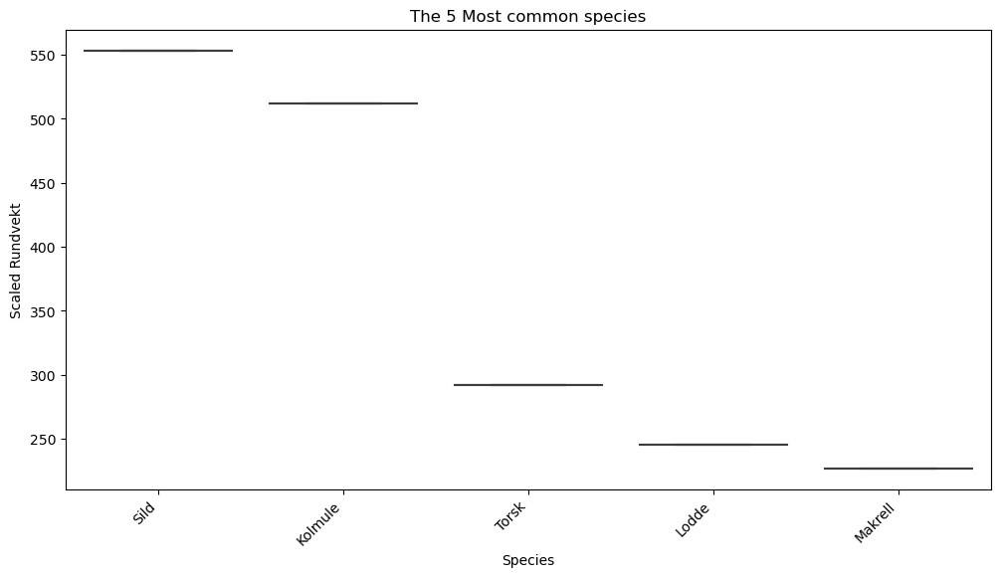

In [28]:
# Create a boxplot using Seaborn
plt.figure(figsize=(12, 6))
sns.boxplot(x='Art - FDIR', y='Rundvekt', data=grouped_species_most_common)
plt.xlabel('Species')
plt.ylabel('Scaled Rundvekt')
plt.title(f'The {range_of_common} Most common species')
plt.xticks(rotation=45, ha='right')  # Adjust rotation for better readability
plt.show()

In [29]:
from collections import Counter
# Assuming you have a DataFrameGroupBy object named grouped_data
# Example: grouped_data = df.groupby(['ExistingGroupColumn'])

# Define a function to count occurrences of each tool across all groups
def count_tools_across_groups(subgroup):
    # Use Counter to count occurrences of each tool within the subgroup
    tool_counter = Counter(subgroup['Redskap FAO'])
    
    return tool_counter

# Apply the counting function across all groups
tools_counter = grouped_data.apply(count_tools_across_groups)

# Combine counters from all groups
combined_counter = Counter()
for counter in tools_counter:
    combined_counter.update(counter)

# Create a DataFrame with the most common tools and their counts
most_common_tools_df = pd.DataFrame(list(combined_counter.items()), columns=['Tool', 'Count'])

# Sort the DataFrame by count in descending order
most_common_tools_df = most_common_tools_df.sort_values(by='Count', ascending=False).reset_index(drop=True)
# Extract 'Rundvekt' column for scaling

count_coloumn = most_common_tools_df[['Count']]

# Reshape the array to 2D before scaling
count_values = count_coloumn.values.reshape(-1, 1)

# Fit and transform the data for rundvekt
scaled_counts = scaler.fit_transform(count_values)

# Replace the 'Rundvekt' column with the scaled values in the DataFrame
most_common_tools_df['Count'] = scaled_counts.flatten()


In [30]:
grouped_tool_most_common = most_common_tools_df[:range_of_common]
grouped_tool_other_common = most_common_tools_df[range_of_common:]

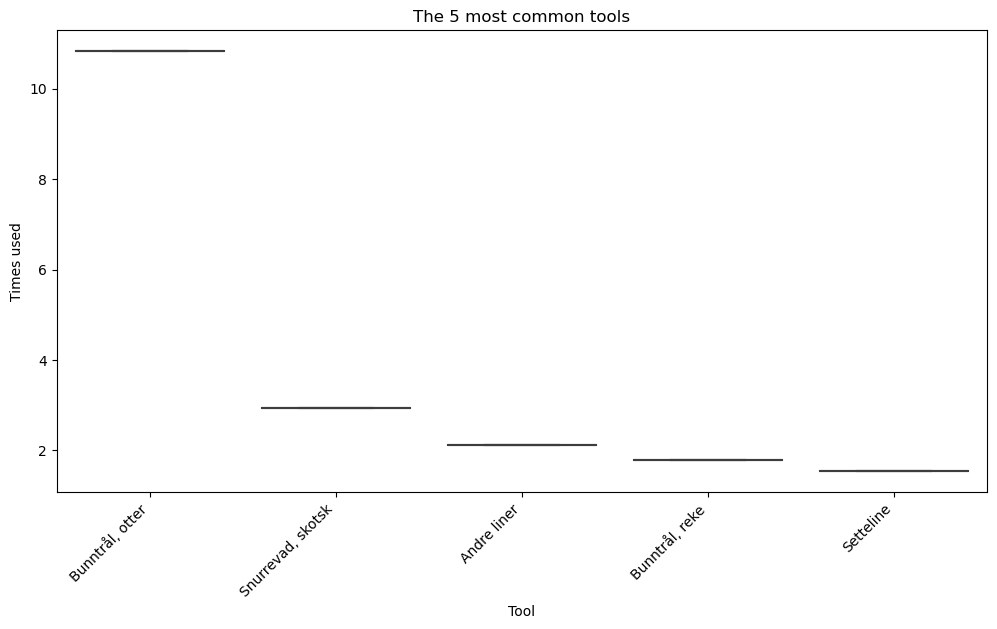

In [31]:
# Create a boxplot using Seaborn
plt.figure(figsize=(12, 6))
sns.boxplot(x='Tool', y='Count', data=grouped_tool_most_common)
plt.xlabel('Tool')
plt.ylabel('Times used')
plt.title(f'The {range_of_common} most common tools')
plt.xticks(rotation=45, ha='right')  # Adjust rotation for better readability
plt.show()

In [32]:
nan_counts = grouped_data.apply(lambda x: x.isna().sum())

In [33]:
# Assuming nan_counts.sum() returns a Series with column names and their total NaN counts
total_nan_counts = nan_counts.sum()

# Create a DataFrame with columns 'Column' and 'Count'
most_common_nan_counts = pd.DataFrame({'Column': total_nan_counts.index, 'Count': total_nan_counts.values})


In [34]:
most_common_nan_counts.sum()

Column    Melding IDStartposisjon breddeStartposisjon le...
Count                                                     0
dtype: object

In [35]:
#Now that we dont have any NaN values, we can continue, keeping in mind of some "uknown values", and "0" values 
# these are contextual sentual though, since it dosent make sense that a ship has a width of "0" or the tools used (equipment)
# is "Uknown", so we can later see when model building if these things will be changed, but for now, we continue forward:

In [36]:
import numpy as np

grouped_data_df = grouped_data.apply(lambda x: x.head(1)).reset_index(drop=True).sample(frac=1)

In [37]:
grouped_data_df.reset_index(inplace=True)
grouped_data_df = pd.merge(grouped_data_df, scaled_data, on='Melding ID', suffixes=('_grouped_data', '_total_catch'))

In [38]:
grouped_data_df['Species_Classification'] = np.where(
    grouped_data_df['Hovedart FAO'].isin(grouped_species_most_common["Art - FDIR"]),
    grouped_data_df['Hovedart FAO'],
    'Other'
)
# replacing the values, so that "Hovedart FAO" and "Art - FDIR" are the same in all cases
grouped_data_df['Art - FDIR'] = grouped_data_df['Art - FDIR'].replace({
    'Reke av  Palaemonidaeslekten': 'Reke av  Palaemonidaefamilien',
    'Hakes nei *': 'Hakes nei. *',
    'Annen vanlig ti-armet blekksprut': 'Various squids nei *',
    'Pink cusk-eel *' : 'Pink cusk-eel*'
})
main_fish_rows = grouped_data_df[grouped_data_df['Hovedart FAO'] == grouped_data_df['Art - FDIR']]

grouped_data_df['Main Fish Weight'] = main_fish_rows['Rundvekt']


mismatched_rows = grouped_data_df[grouped_data_df['Hovedart FAO'] != grouped_data_df['Art - FDIR']]
for index in mismatched_rows.index:
   
    group_size = grouped_data_df.loc[grouped_data_df.index == index].shape
    print(f"Group at index {index} has size: {group_size}")

    
    art_fdir_value = grouped_data_df.at[index, 'Art - FDIR']
    print(f"Art FDIR value for this row: {art_fdir_value}")
    
    print(art_fdir_value == grouped_data_df.at[index, 'Hovedart FAO'])
    print(art_fdir_value)
    print(grouped_data_df.at[index, 'Hovedart FAO'])
    
    print("\n") 

In [39]:
grouped_data_df.columns

Index(['index', 'Melding ID', 'Startposisjon bredde', 'Startposisjon lengde',
       'Hovedområde start', 'Redskap FAO', 'Hovedart FAO', 'Art - FDIR',
       'Rundvekt', 'Bredde', 'Fartøylengde', 'Scaled Rundvekt', 'Scaled Size',
       'Non_scaled_Rundvekt', 'Species_Classification', 'Main Fish Weight'],
      dtype='object')

In [40]:
print(grouped_data_df['Art - FDIR'].unique())
print(grouped_species_most_common)
print(grouped_data_df["Main Fish Weight"])

['Torsk' 'Sei' 'Dypvannsreke' 'Uer (vanlig)' 'Brosme' 'Sild' 'Snabeluer'
 'Øyepål' 'Hyse' 'Blåkveite' 'Sjøkreps' 'Tobis og annen sil' 'Lodde'
 'Makrell' 'Kolmule' 'Lange' 'Snøkrabbe' 'Reke av  Palaemonidaefamilien'
 'Lysing' 'Flekksteinbit' 'Breiflabb' 'Hestmakrell' 'Taskekrabbe'
 'Brisling' 'Strømsild/Vassild' 'Vassild' 'Raudåte' 'Lyr' 'Rødspette'
 'Hvitting' 'Annen skate og rokke' 'Annen marin fisk'
 'Reke av  Pandalusslekten' 'Steinbiter' 'Vågehval' 'Lanternfishes nei *'
 'Pink cusk-eel*' 'Gråsteinbit' 'Kveite' 'Sølvtorsk' 'Makrellstørje'
 'Strømsild' 'Blålange' 'Smørflyndre' 'Blåsteinbit' 'Pigghå' 'Lomre'
 'Kongekrabbe' 'Skrubbe' 'Akkar' 'Laksesild' 'Hakes nei. *'
 'Various squids nei *' 'Gapeflyndre' 'Rognkjeks (felles)' 'Havmus'
 'Annen flyndre' 'Glassvar' 'Skjellbrosme']
  Art - FDIR    Rundvekt
0       Sild  553.501891
1    Kolmule  512.190447
2      Torsk  291.857609
3      Lodde  244.965436
4    Makrell  226.948124
0         3500.0
1         1306.0
2         9677.0
3         

In [41]:
grouped_species_most_common["Art - FDIR"]

0       Sild
1    Kolmule
2      Torsk
3      Lodde
4    Makrell
Name: Art - FDIR, dtype: object

In [42]:
grouped_data_df['Species_Classification']

0        Torsk
1        Torsk
2        Other
3        Other
4        Other
         ...  
46356    Other
46357    Other
46358    Torsk
46359    Other
46360    Other
Name: Species_Classification, Length: 46361, dtype: object

In [43]:
grouped_data_df["Main Fish Weight"].isna().sum()

0

In [44]:
fig = px.density_mapbox(
    grouped_data_df, 
    lat='Startposisjon bredde', 
    lon='Startposisjon lengde', 
    z='Scaled Rundvekt',
    hover_data=['Melding ID','Species_Classification'],
    radius=10,
    zoom=3,
    height=300
)



fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 0, "l": 0, "b": 0}
)
fig.show()

In [45]:
# DONT RUN YET:
sampled_data = grouped_data_df.sample(frac=0.03) 
fig = px.scatter_geo(
    sampled_data, 
    lat='Startposisjon bredde', 
    lon='Startposisjon lengde', 
    color="Species_Classification", 
    hover_name="Melding ID", 
    size="Main Fish Weight", 
    projection="natural earth",
    scope="europe"  
)

fig.show()

In [46]:
#Now we should start getting our data more ready for our cluster methods, first

In [47]:
from sklearn.cluster import DBSCAN

In [48]:
features = ['Startposisjon bredde', 'Startposisjon lengde',]